Insurance Claim Fraud Detection
Project Description
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

Independent Variables
1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported

Dataset Link-  
•	https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv



Importing of Libraries

In [778]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.preprocessing import power_transform
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix, roc_curve, roc_auc_score
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics  import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

 Reading the csv file from dataset

In [779]:
INS= pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
INS

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


The dataset contains both categorical and numerical columns. Here "fraud_reported"is our target column, since it has two categories so it termed to be "Classification Problem"where we need predict if an insurance claim is fraudulent or not.
Here we can  0's and ,'/' ,'?' in the dataset which is needed to be treated also
Column _c39 contains NaN values

In [780]:
INS.shape

(1000, 40)

In [781]:
INS.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [782]:
INS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

This gives info about datset.. column _c39 have all null values and no other columns have null values.. and data types of columns are float64(2), int64(17), object(21)..

In [783]:
INS.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

Dataset contains both categorical and numerical columns... Target variable is Object.. categorical columns will be encoded later

In [784]:
INS.columns = INS.columns.str.replace(' ', '_')
INS.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [785]:
# Value counts of each columns
for i in INS.columns:
        print(INS[i].value_counts())
        print('\n\n')
        print ('*'*100)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64



****************************************************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64



****************************************************************************************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64



********************

These are the columns which contains "?" sign. We see these column to be categorical so we will replace "?" values with most frequently occuring values of the respective columns that is their mode values.

In [786]:
# Checking which columns contains "?" sign as it is a NaN value
INS[INS.columns[(INS == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

These 3 columns contains ?.. Lets replace it first..
Replacing "?" by their mode values
Filling ? with proper data type in each ? containing columns

In [787]:
INS["collision_type"].mode()

0    Rear Collision
dtype: object

In [788]:
INS["property_damage"].mode()

0    ?
dtype: object

In [789]:
# to replace '?' with mode value
INS['collision_type'] = INS.collision_type.str.replace('?', 'Rear Collision')

In [790]:
INS["police_report_available"].mode()

0     ?
1    NO
dtype: object

In [791]:
# to replace '?' with mode value
INS['collision_type'] = INS.collision_type.str.replace('?', 'Rear Collision')

In [792]:
# Replacing "?" by their mode values
INS['collision_type'] = INS.collision_type.str.replace('?', INS['collision_type'].mode()[0])
INS['property_damage'] = INS.property_damage.str.replace('?', "NO")
INS['police_report_available'] = INS.police_report_available.str.replace('?', "NO")

In [793]:
# Checking which columns contains "?" sign as it is a NaN value
INS[INS.columns[(INS == '?').any()]].nunique()

Series([], dtype: float64)

In [794]:
INS

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,NO,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,NO,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


The policy_csl column showing object data type but it contains numerical data, may be it is because of the presence of "/" in that column. So first we will extract two columns csl_per_person and csl_per_accident from policy_csl colums and then will convert their object data type into integer data type.

In [795]:
# Extracting csl_per_person and csl_per_accident from policy_csl column
INS['csl_per_person'] = INS.policy_csl.str.split('/', expand=True)[0]
INS['csl_per_accident'] = INS.policy_csl.str.split('/', expand=True)[1]


In [796]:
# Converting object data type into integer data type
INS['csl_per_person'] = INS['csl_per_person'].astype('int64')
INS['csl_per_accident'] = INS['csl_per_accident'].astype('int64')

In [797]:
# Changing date column from object type to Date Type
INS['policy_bind_date']=pd.to_datetime(INS['policy_bind_date'])

In [798]:
INS['policy Month']=INS['policy_bind_date'].apply(lambda x:x.month)
INS['policy Day']=INS['policy_bind_date'].apply(lambda x:x.day)

In [799]:
# Changing date column from object type to Date Type
INS['incident_date']=pd.to_datetime(INS['incident_date'])

In [800]:
INS['incident Month']=INS['incident_date'].apply(lambda x:x.month)
INS['incident Day']=INS['incident_date'].apply(lambda x:x.day)

In [801]:
INS.isnull().sum()     #no Missing  or Nan Values

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

All columns have 0 null values except _c39 have all null values.. but few columns contains ? which is also considered as null

In [802]:
INS.duplicated().sum()

0

In [803]:
#dropping duplicate rows and resetting index
INS=INS.drop_duplicates()
print('Number of rows after removing duplicates=', len(INS))

Number of rows after removing duplicates= 1000


In [804]:
INS.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

Observation
In Collision type we have ? which is needed to be corrected
In property damage we have ? present
police_report_available have ? present
By looking at the value counts of each column we can realize that the columns umbrella_limit, capital-gains and capital-loss contains more zero values and it is more than and around 50%.
umbrella_limit columns has more that 70% of zero values, let's drop that column.

Dropping umbrella_limit column bcoz around 70% of data is 0
These are the unique values present in each column.We can observe the columns policy_number and incident_location have 1000 unique values which means they have only one value count. So it not required for the prediction so we can drop it.
Dropping policy_number and incident_location columns

In [805]:
INS.drop(['_c39','policy_csl','incident_date','policy_bind_date','umbrella_limit','incident_location','policy_number'],axis=1,inplace=True)

<AxesSubplot:>

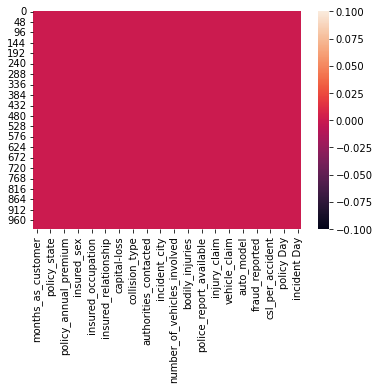

In [806]:
sns.heatmap(INS.isnull())

In [807]:
INS.isnull().sum()     #no Missing  or Nan Values

months_as_customer             0
age                            0
policy_state                   0
policy_deductable              0
policy_annual_premium          0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model

In [808]:
INS.duplicated().sum()

0

In [809]:
INS

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident,policy Month,policy Day,incident Month,incident Day
0,328,48,OH,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,...,Saab,92x,2004,Y,250,500,10,17,1,25
1,228,42,IN,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,...,Mercedes,E400,2007,Y,250,500,6,27,1,21
2,134,29,OH,2000,1413.14,430632,FEMALE,PhD,sales,board-games,...,Dodge,RAM,2007,N,100,300,6,9,2,22
3,256,41,IL,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,...,Chevrolet,Tahoe,2014,Y,250,500,5,25,10,1
4,228,44,IL,1000,1583.91,610706,MALE,Associate,sales,board-games,...,Accura,RSX,2009,N,500,1000,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,431289,FEMALE,Masters,craft-repair,paintball,...,Honda,Accord,2006,N,500,1000,7,16,2,22
996,285,41,IL,1000,1436.79,608177,FEMALE,PhD,prof-specialty,sleeping,...,Volkswagen,Passat,2015,N,100,300,5,1,1,24
997,130,34,OH,500,1383.49,442797,FEMALE,Masters,armed-forces,bungie-jumping,...,Suburu,Impreza,1996,N,250,500,2,17,1,23
998,458,62,IL,2000,1356.92,441714,MALE,Associate,handlers-cleaners,base-jumping,...,Audi,A5,1998,N,500,1000,11,18,2,26


In [810]:
#Frequency of 'fraud_reported'
INS['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

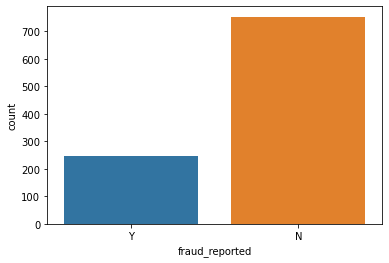

In [811]:
# Plotting the 'fraud_reported' frequency
sns.countplot(data=INS,x='fraud_reported')

In [812]:
#Normalizing the frequency table of 'fraud_reported' variable
INS['fraud_reported'].value_counts(normalize=True)

N    0.753
Y    0.247
Name: fraud_reported, dtype: float64

In [813]:
#Frequency table
INS['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

# EDA

Encoding Techniques

In [814]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()
for i in INS.columns:
    if INS[i].dtypes=='object':
        INS[i]=enc.fit_transform(INS[i].values.reshape(-1,1))
INS

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident,policy Month,policy Day,incident Month,incident Day
0,328,48,2.0,1000,1406.91,466132,1.0,4.0,2.0,17.0,...,10.0,1.0,2004,1.0,250,500,10,17,1,25
1,228,42,1.0,2000,1197.22,468176,1.0,4.0,6.0,15.0,...,8.0,12.0,2007,1.0,250,500,6,27,1,21
2,134,29,2.0,2000,1413.14,430632,0.0,6.0,11.0,2.0,...,4.0,30.0,2007,0.0,100,300,6,9,2,22
3,256,41,0.0,2000,1415.74,608117,0.0,6.0,1.0,2.0,...,3.0,34.0,2014,1.0,250,500,5,25,10,1
4,228,44,0.0,1000,1583.91,610706,1.0,0.0,11.0,2.0,...,0.0,31.0,2009,0.0,500,1000,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,1000,1310.80,431289,0.0,5.0,2.0,13.0,...,6.0,6.0,2006,0.0,500,1000,7,16,2,22
996,285,41,0.0,1000,1436.79,608177,0.0,6.0,9.0,17.0,...,13.0,28.0,2015,0.0,100,300,5,1,1,24
997,130,34,2.0,500,1383.49,442797,0.0,5.0,1.0,3.0,...,11.0,19.0,1996,0.0,250,500,2,17,1,23
998,458,62,0.0,2000,1356.92,441714,1.0,0.0,5.0,0.0,...,1.0,5.0,1998,0.0,500,1000,11,18,2,26


In [815]:
INS.dtypes

months_as_customer               int64
age                              int64
policy_state                   float64
policy_deductable                int64
policy_annual_premium          float64
insured_zip                      int64
insured_sex                    float64
insured_education_level        float64
insured_occupation             float64
insured_hobbies                float64
insured_relationship           float64
capital-gains                    int64
capital-loss                     int64
incident_type                  float64
collision_type                 float64
incident_severity              float64
authorities_contacted          float64
incident_state                 float64
incident_city                  float64
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                float64
bodily_injuries                  int64
witnesses                        int64
police_report_available        float64
total_claim_amount       

Visualization using Count and Bar Plot for Input and output Variables

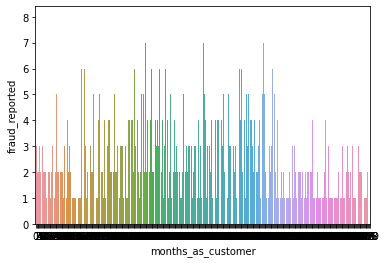

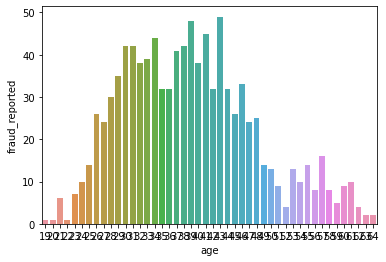

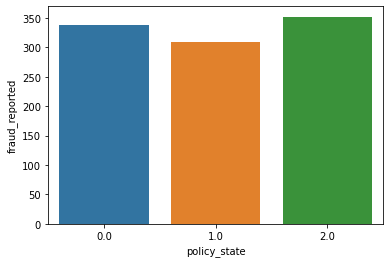

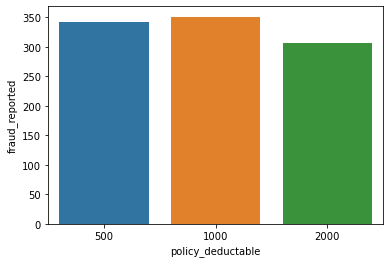

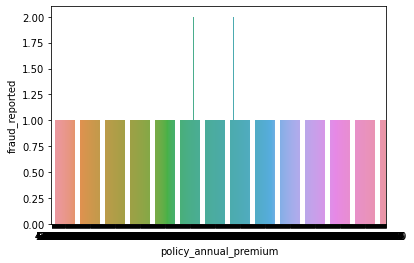

...

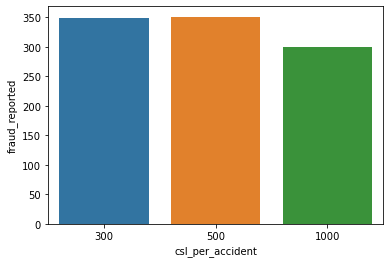

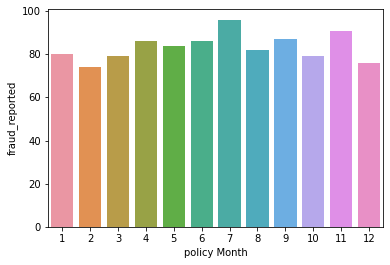

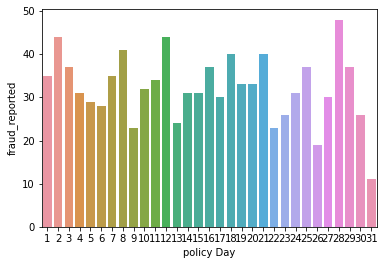

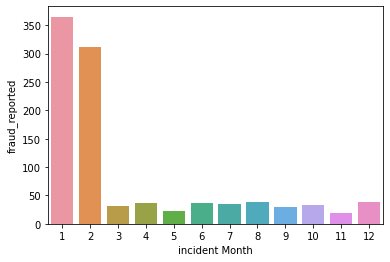

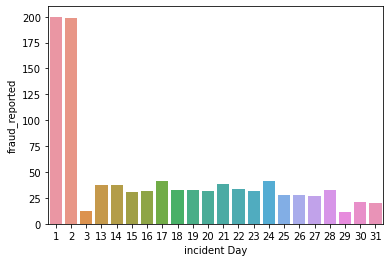

In [816]:
for column in INS.columns:
    sns.countplot(x=column, data=INS)
    plt.xlabel(column)
    plt.ylabel('fraud_reported')
    plt.show()

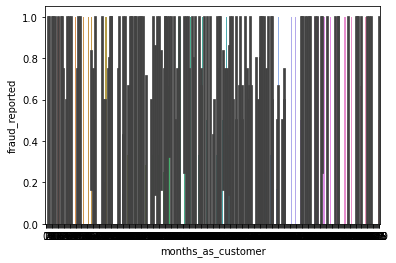

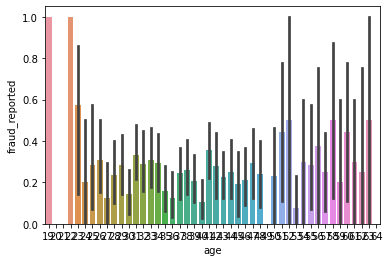

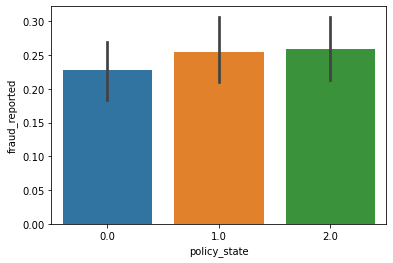

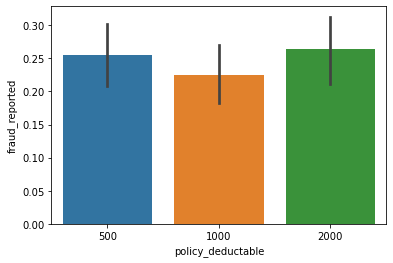

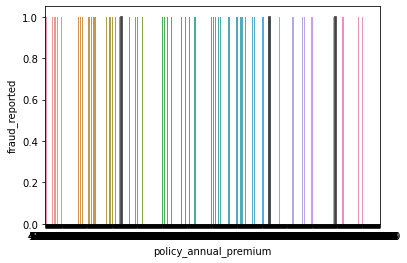

...

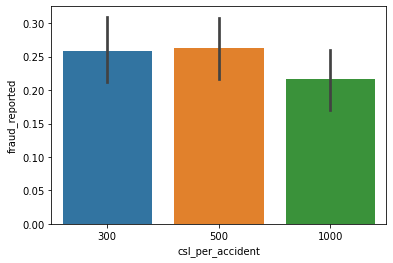

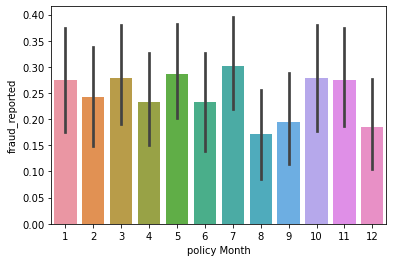

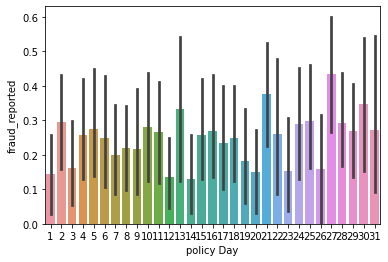

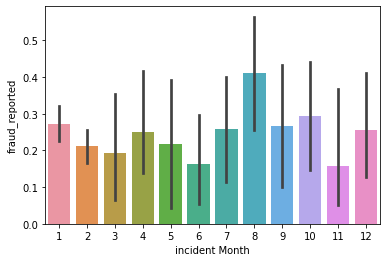

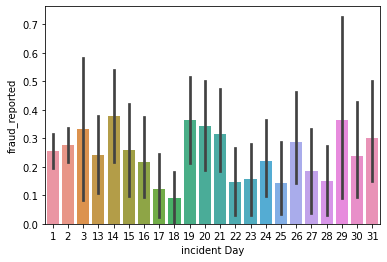

In [817]:
for column in INS.columns:
    sns.barplot(x=column, y='fraud_reported', data=INS)
    plt.xlabel(column)
    plt.show()

Histogram View

array([[<AxesSubplot:title={'center':'months_as_customer'}>,
        <AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'policy_state'}>,
        <AxesSubplot:title={'center':'policy_deductable'}>,
        <AxesSubplot:title={'center':'policy_annual_premium'}>,
        <AxesSubplot:title={'center':'insured_zip'}>],
       [<AxesSubplot:title={'center':'insured_sex'}>,
        <AxesSubplot:title={'center':'insured_education_level'}>,
        <AxesSubplot:title={'center':'insured_occupation'}>,
        <AxesSubplot:title={'center':'insured_hobbies'}>,
        <AxesSubplot:title={'center':'insured_relationship'}>,
        <AxesSubplot:title={'center':'capital-gains'}>],
       [<AxesSubplot:title={'center':'capital-loss'}>,
        <AxesSubplot:title={'center':'incident_type'}>,
        <AxesSubplot:title={'center':'collision_type'}>,
        <AxesSubplot:title={'center':'incident_severity'}>,
        <AxesSubplot:title={'center':'authorities_contacted'}>,
        

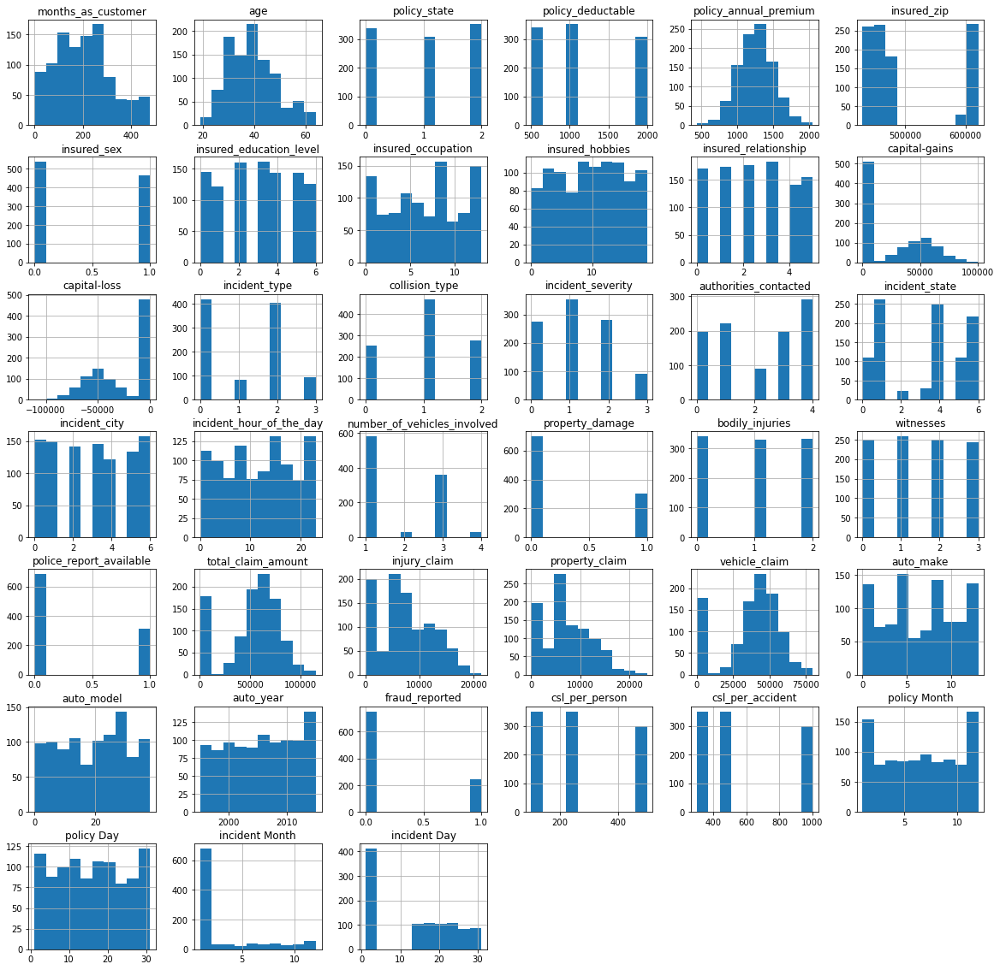

In [818]:
INS.hist(bins=10, figsize=(20,20))

Bivarate

In [819]:
INS.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_deductable',
       'policy_annual_premium', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'csl_per_person', 'csl_per_accident',
       'policy Month', 'policy Day', 'incident Month', 'incident Day'],
      dtype='object')

<AxesSubplot:xlabel='months_as_customer', ylabel='fraud_reported'>

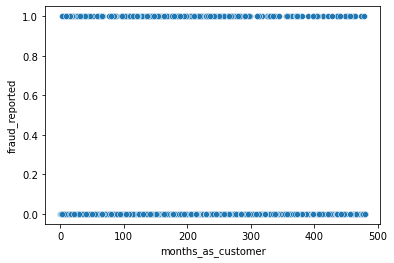

In [820]:
sns.scatterplot(x='months_as_customer',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='age', ylabel='fraud_reported'>

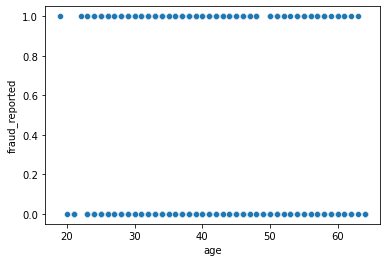

In [821]:
sns.scatterplot(x='age',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='insured_sex', ylabel='fraud_reported'>

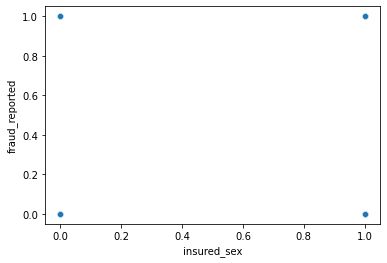

In [822]:
sns.scatterplot(x='insured_sex',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='insured_education_level', ylabel='fraud_reported'>

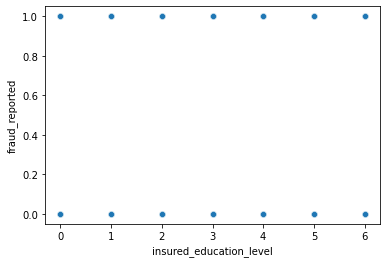

In [823]:
sns.scatterplot(x='insured_education_level',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='insured_occupation', ylabel='fraud_reported'>

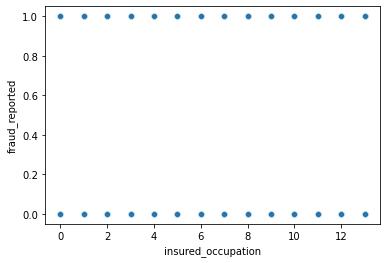

In [824]:
sns.scatterplot(x='insured_occupation',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='insured_hobbies', ylabel='fraud_reported'>

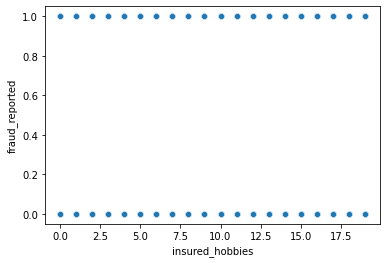

In [825]:
sns.scatterplot(x='insured_hobbies',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='insured_relationship', ylabel='fraud_reported'>

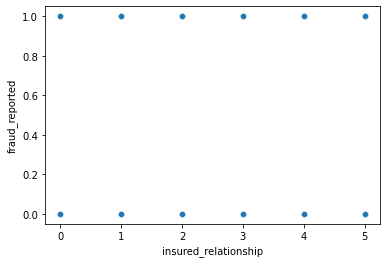

In [826]:
sns.scatterplot(x='insured_relationship',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='incident_type', ylabel='fraud_reported'>

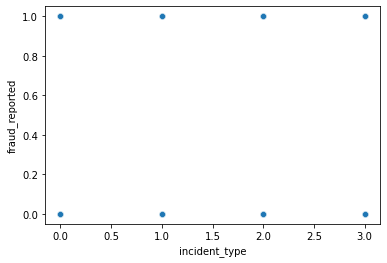

In [827]:
sns.scatterplot(x='incident_type',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='collision_type', ylabel='fraud_reported'>

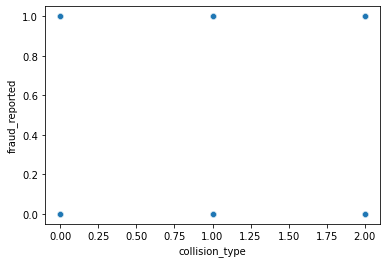

In [828]:
sns.scatterplot(x='collision_type',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='incident_severity', ylabel='fraud_reported'>

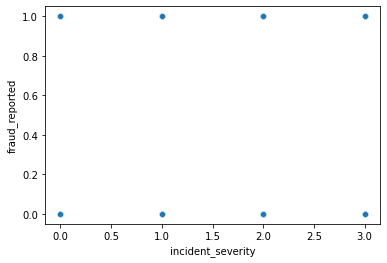

In [829]:
sns.scatterplot(x='incident_severity',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='fraud_reported'>

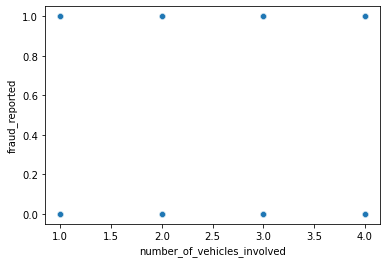

In [830]:
sns.scatterplot(x='number_of_vehicles_involved',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='incident_severity', ylabel='fraud_reported'>

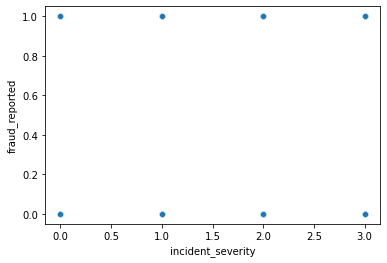

In [831]:
sns.scatterplot(x='incident_severity',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='bodily_injuries', ylabel='fraud_reported'>

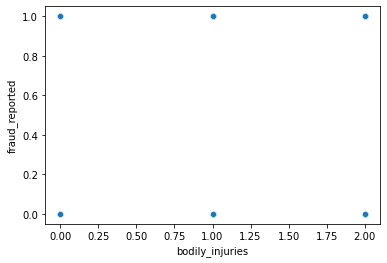

In [832]:
sns.scatterplot(x='bodily_injuries',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='police_report_available', ylabel='fraud_reported'>

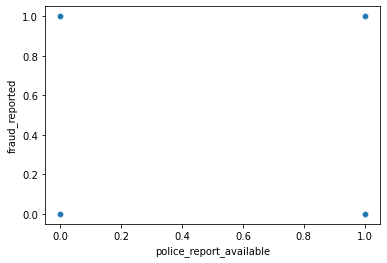

In [833]:
sns.scatterplot(x='police_report_available',y='fraud_reported',data=INS)

<AxesSubplot:xlabel='months_as_customer', ylabel='Density'>

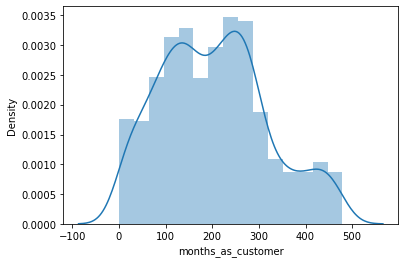

In [834]:
sns.distplot(INS['months_as_customer'])

<AxesSubplot:xlabel='age', ylabel='Density'>

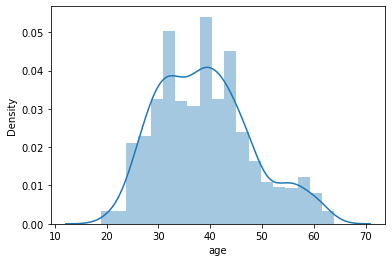

In [835]:
sns.distplot(INS['age'])

<AxesSubplot:xlabel='insured_sex', ylabel='Density'>

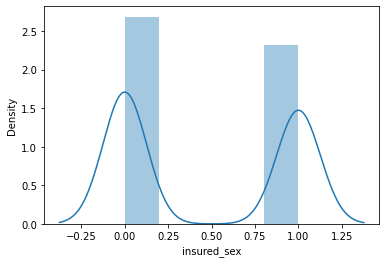

In [836]:
sns.distplot(INS['insured_sex'])

<AxesSubplot:xlabel='insured_education_level', ylabel='Density'>

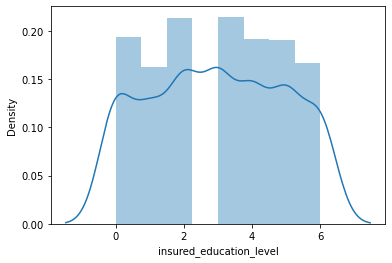

In [837]:
sns.distplot(INS['insured_education_level'])

<AxesSubplot:xlabel='insured_occupation', ylabel='Density'>

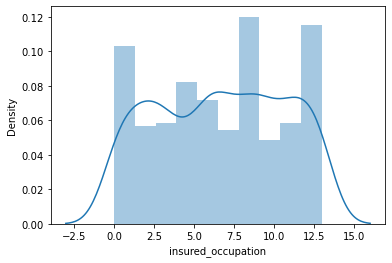

In [838]:
sns.distplot(INS['insured_occupation'])

<AxesSubplot:xlabel='insured_hobbies', ylabel='Density'>

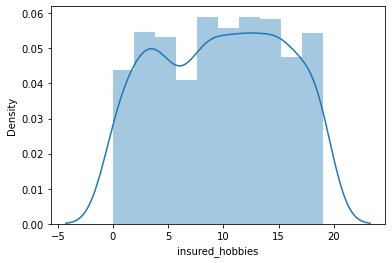

In [839]:
sns.distplot(INS['insured_hobbies'])

<AxesSubplot:xlabel='insured_relationship', ylabel='Density'>

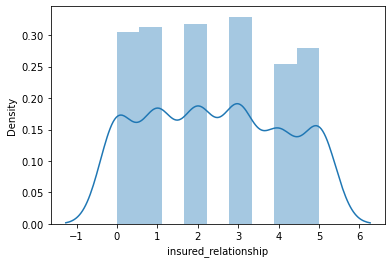

In [840]:
sns.distplot(INS['insured_relationship'])

<AxesSubplot:xlabel='incident_type', ylabel='Density'>

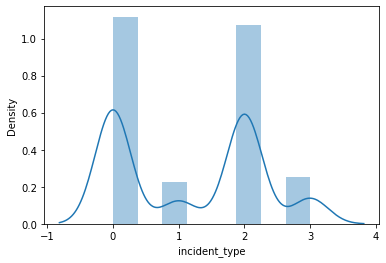

In [841]:
sns.distplot(INS['incident_type'])

<AxesSubplot:xlabel='incident_severity', ylabel='Density'>

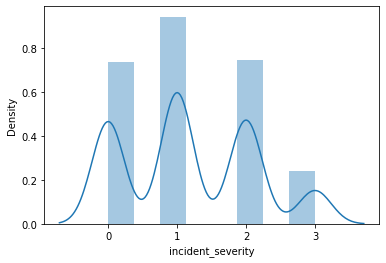

In [842]:
sns.distplot(INS['incident_severity'])

<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='Density'>

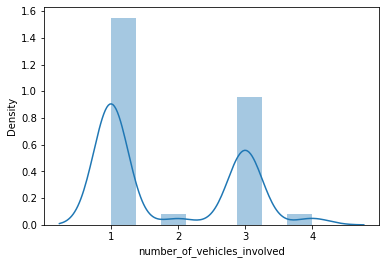

In [843]:
sns.distplot(INS['number_of_vehicles_involved'])

<AxesSubplot:xlabel='bodily_injuries', ylabel='Density'>

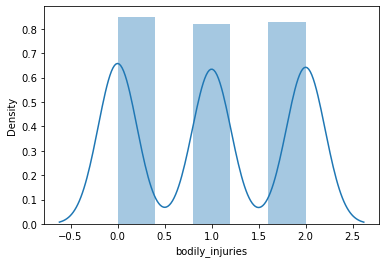

In [844]:
sns.distplot(INS['bodily_injuries'])

<AxesSubplot:xlabel='collision_type', ylabel='Density'>

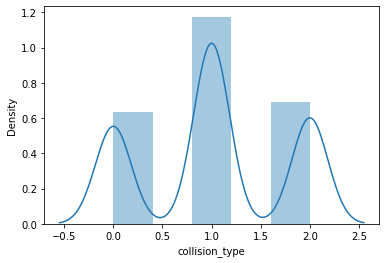

In [845]:
sns.distplot(INS['collision_type'])

<AxesSubplot:xlabel='fraud_reported', ylabel='Density'>

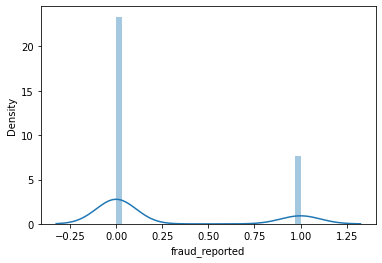

In [846]:
sns.distplot(INS['fraud_reported'])

<AxesSubplot:xlabel='police_report_available', ylabel='Density'>

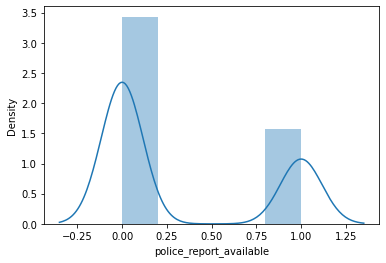

In [847]:
sns.distplot(INS['police_report_available'])

 univarate Analysis

Both male and female have insurance but the count for Female is bit higher than Male counts.

The count is pretty much same for all the education level but still the people who have completed their college and PhD have less count compared to others.

Similar to insured education, insured relationship is also almost equally distributed.

While looking at the incident type, Multi-vehicle collision and Single Vehicle Collision have pretty much similar counts of around 41% and 400%. But the count is very less in Parked car and Vehicle Theft.

The collision type has 3 different types . In this the count is high in Rear collision and the other two types have almost equal counts.

As we observe the propert damage plot, around 69% of the people did not face any property damage while 30% of the people faced the property damage.

Over 68% of the people were produced the police reports while 31% of the people didn't submit any police reports.

Above are the count plots for the remaining categorical columns. From the count plots we can observe the following things:-

In the insured occupation we can observe most of the data is covered by machine operation inspector followed by professional speciality. Apart from this all the other insured occupations have almost same couns.

With respect to insured hobbies, we can notice reading covered the highest data followed by exercise. And other categories have the average counts.

The incodent severity count is high for Minor damages and trivial damage data has very less count compared to others.

When the accidents occurs then most of the authorities contacts the police, here the the category police covers highest data and Fire having the second highest count. But Ambulance and Others have almost same counts and the count is very less for None compared to all.

With respect to the incident state, New York, South Carolina and West Virginia states have highest counts.

In incident city, almost all the columns have equal counts.

When we look at the vehicle manufactured companies, the categories Saab, Suburu, Dodge, Nissan and Volkswagen have highest counts.

When we take a look at the vehicle models then RAM and Wrangler automobile models have highest counts and also RSX and Accord have very less count.

Above are the distribution plots for all the numerical columns. From the distplots we can observe the following things:

The data is normally distributed in most of the columns.

Some of the columns like capital gains and incident months have mean value greater than the median, hence they are skewed to right.

The data in the column capital loss is skewed to left since the median is greater than the mean

Bivariate Analysis

From the above scatter plot we can observe the following things:-

There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in htis case.

In the second graph we can observe the positive linear relation, as total claim amount increases, injury claim is also increases.

Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases.

In the fourth plot we can observe the data is scattered and there is no much relation between the features.



Multivariate Analysis

<Figure size 1800x2160 with 0 Axes>

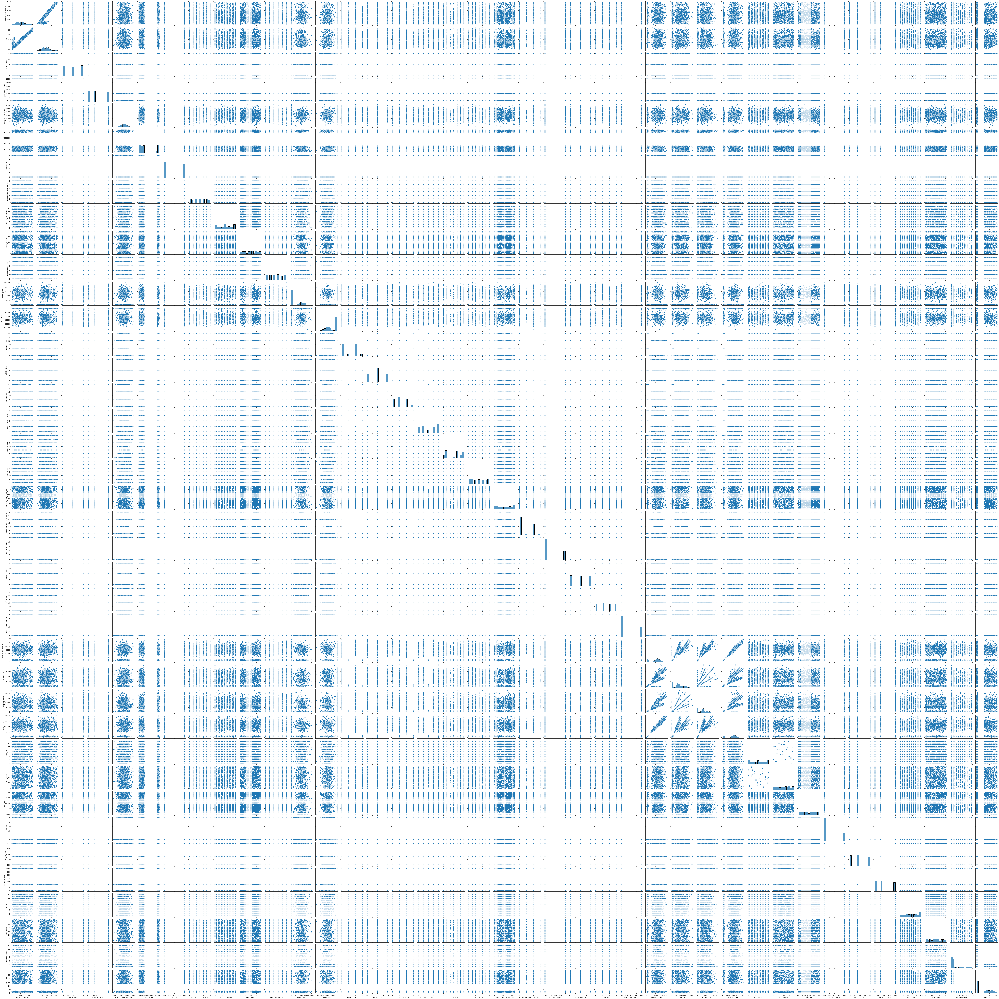

In [848]:
plt.figure(figsize=(25,30))
sns.pairplot(INS)
plt.show()

The pairplot gives the pairwise relation between the features on the basis of the target "fraud_reported". On the diagonal we can notice the distribution plots.
From the pair plot we can observe some of the features have strong correlation with each other.
We can also find some outliers presentin the data, we will remove them using either Zscore 

Now Lets See that counts of each columns

In [849]:
for i in INS.columns:
        print(INS[i].value_counts())
        print('*'*100)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
****************************************************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
****************************************************************************************************
2.0    352
0.0    338
1.0    310
Name: policy_state, dtype: int64
****************************************************************************************************
1000    351
500     342
2000    307
Name: 

Correlation

<AxesSubplot:>

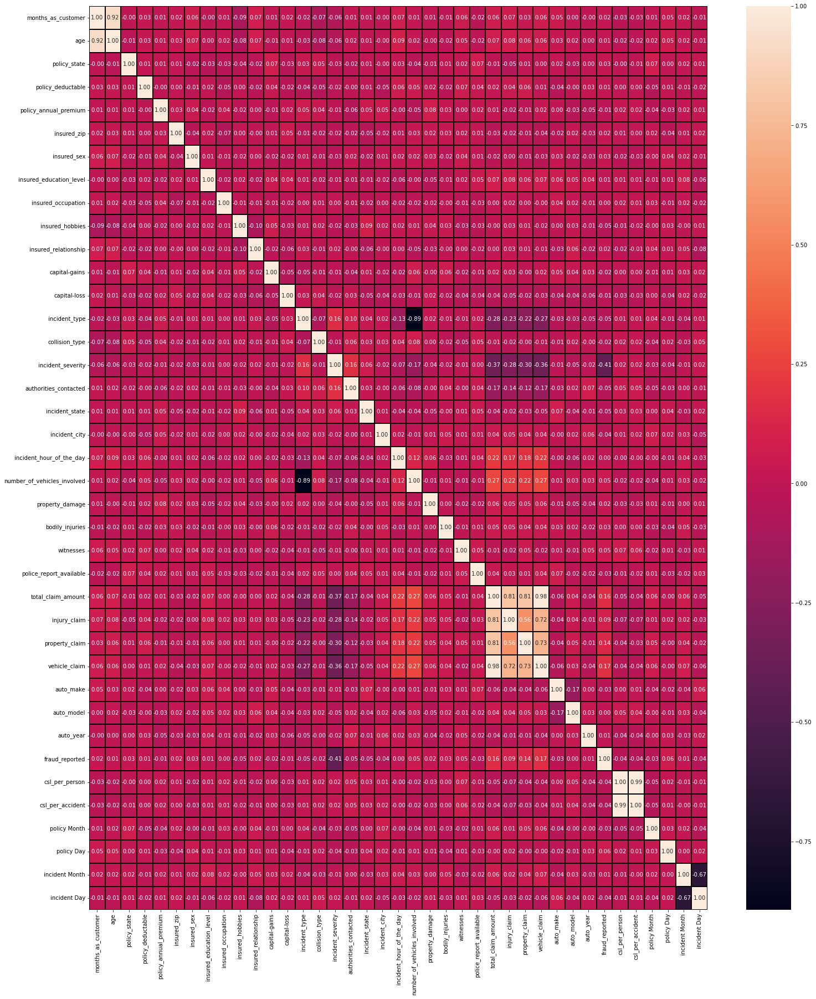

In [850]:
plt.figure(figsize = (25,30))
sns.heatmap(INS.corr(),annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between feature to feature and feature to label. This heat mapcontains both positive and negative correlation.
multicolinearty can be seen in following columns-

incident type and number_of_vehicles_invovled

incident_month and incident_day

total_claim_amount and injury_claim

total_claim_amount and property_claim

injury_claim and vehicle_claim

total_claim_amount and vehicle_claim

vehicle_claim and property_claim

total_claim_amount and property_claim

policy_bind_year is least correlated with fraud_reported.

insured_occupation and auto_model are less correlated with fraud_reported.

auto_age and incident_hour_of_the_day also less correlated with fraud_reported.


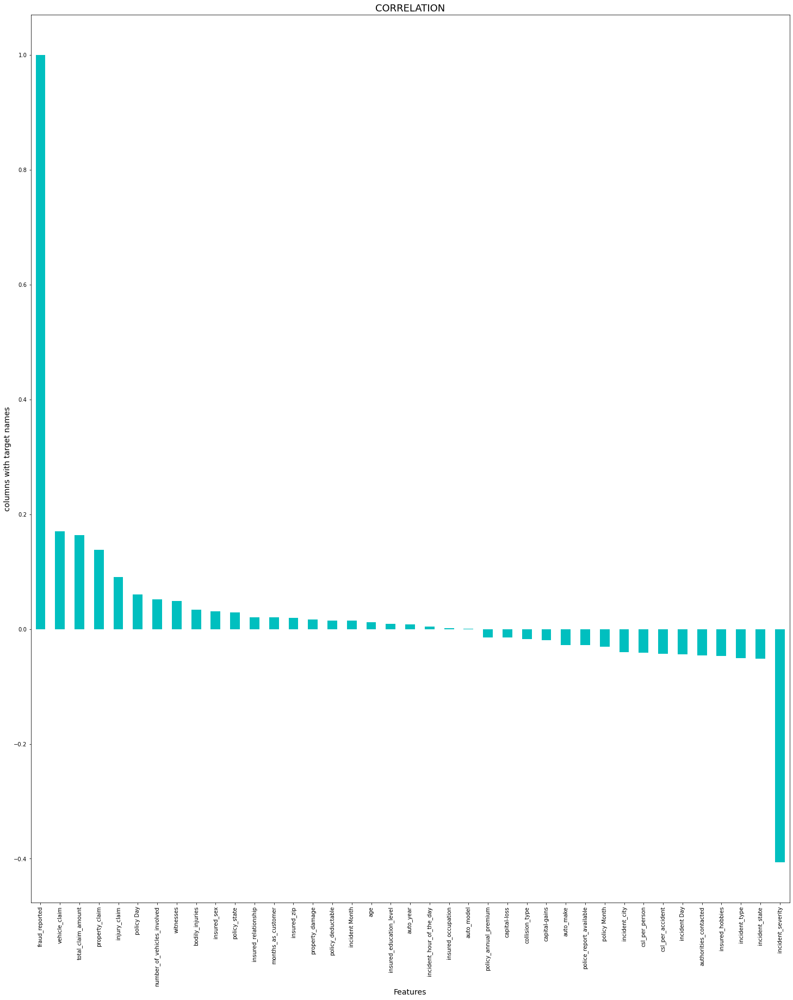

In [851]:
#checking the columns which are positively and negatively correlated
plt.figure(figsize=(25,30))
INS.corr()['fraud_reported'].sort_values(ascending=False).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('columns with target names',fontsize=14)
plt.title('CORRELATION',fontsize=18)
plt.show()

lets drop the Negative and less co related values from the columns

In [852]:
INS.drop(['incident_severity','age', 'injury_claim', 'property_claim', 'auto_make', 'auto_model', 'auto_year', 'incident_hour_of_the_day', 
                     'collision_type', 'total_claim_amount', 'insured_education_level','csl_per_accident','csl_per_person'],axis=1,inplace=True)

In [853]:
INS.corr()

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,fraud_reported,policy Month,policy Day,incident Month,incident Day
months_as_customer,1.000000,-0.000328,0.026807,0.005018,0.017895,0.060925,0.009814,-0.093661,0.069727,0.006399,...,0.005488,-0.010162,0.058383,-0.022146,0.061013,0.020544,0.005750,0.051728,0.024659,-0.011092
policy_state,-0.000328,1.000000,0.010033,0.012455,0.008777,-0.020481,-0.031215,-0.038689,-0.018506,0.074551,...,-0.008465,0.013384,0.022960,0.069017,0.001425,0.029432,0.071450,0.002277,0.023643,0.014745
policy_deductable,0.026807,0.010033,1.000000,-0.003245,0.004545,-0.009733,-0.046733,0.004061,-0.022945,0.035212,...,0.015770,-0.022765,0.066639,0.038036,0.005269,0.014817,-0.050416,0.009164,-0.006418,-0.018160
policy_annual_premium,0.005018,0.012455,-0.003245,1.000000,0.032354,0.038853,0.035922,-0.018019,0.001925,-0.013738,...,0.080738,0.026780,0.002332,0.021998,0.020246,-0.014480,-0.035355,-0.025183,0.021559,0.014835
insured_zip,0.017895,0.008777,0.004545,0.032354,1.000000,-0.036942,-0.069077,0.002106,-0.002355,0.006303,...,0.023861,0.028695,0.019805,0.009841,-0.041083,0.019368,0.015864,-0.039867,0.005461,0.019095
insured_sex,0.060925,-0.020481,-0.009733,0.038853,-0.036942,1.000000,-0.006160,-0.020317,0.002855,-0.020494,...,0.026969,-0.020297,0.042463,0.006992,-0.029609,0.030873,-0.004033,0.040713,0.024227,-0.007280
insured_occupation,0.009814,-0.031215,-0.046733,0.035922,-0.069077,-0.006160,1.000000,-0.011077,-0.010171,-0.007824,...,-0.016378,-0.000236,-0.014794,-0.025232,-0.000829,0.001564,0.026140,-0.006432,0.019403,-0.022105
insured_hobbies,-0.093661,-0.038689,0.004061,-0.018019,0.002106,-0.020317,-0.011077,1.000000,-0.096772,0.054338,...,0.036193,0.031373,-0.033971,-0.027937,-0.016814,-0.046838,-0.004922,0.028914,-0.000082,0.014893
insured_relationship,0.069727,-0.018506,-0.022945,0.001925,-0.002355,0.002855,-0.010171,-0.096772,1.000000,-0.019439,...,-0.031931,-0.001214,0.002362,-0.017471,-0.006256,0.021043,0.040811,0.010135,0.045927,-0.080738
capital-gains,0.006399,0.074551,0.035212,-0.013738,0.006303,-0.020494,-0.007824,0.054338,-0.019439,1.000000,...,-0.000616,0.055829,-0.017651,-0.012939,0.015836,-0.019173,-0.011102,0.007994,0.029409,0.015418


In [854]:
INS.corr()['fraud_reported'].sort_values()

incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident Day                  -0.044151
incident_city                 -0.040403
policy Month                  -0.030829
police_report_available       -0.027768
capital-gains                 -0.019173
capital-loss                  -0.014863
policy_annual_premium         -0.014480
insured_occupation             0.001564
incident Month                 0.014495
policy_deductable              0.014817
property_damage                0.017202
insured_zip                    0.019368
months_as_customer             0.020544
insured_relationship           0.021043
policy_state                   0.029432
insured_sex                    0.030873
bodily_injuries                0.033877
witnesses                      0.049497
number_of_vehicles_involved    0.051839
policy Day                     0.060643
vehicle_claim                  0.170049


# DESCRIPTIVE STATSTICS

In [855]:
INS.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,203.95400,115.113174,0.00,115.7500,199.5,276.250,479.00
policy_state,1000.0,1.01400,0.830960,0.00,0.0000,1.0,2.000,2.00
policy_deductable,1000.0,1136.00000,611.864673,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1256.40615,244.167395,433.33,1089.6075,1257.2,1415.695,2047.59
insured_zip,1000.0,501214.48800,71701.610941,430104.00,448404.5000,466445.5,603251.000,620962.00
insured_sex,1000.0,0.46300,0.498879,0.00,0.0000,0.0,1.000,1.00
insured_occupation,1000.0,6.65300,4.019048,0.00,3.0000,7.0,10.000,13.00
insured_hobbies,1000.0,9.73100,5.674049,0.00,5.0000,10.0,15.000,19.00
insured_relationship,1000.0,2.41600,1.681003,0.00,1.0000,2.0,4.000,5.00
capital-gains,1000.0,25126.10000,27872.187708,0.00,0.0000,0.0,51025.000,100500.00


This gives the statistical information of the numerical columns present in the dataframe. The summary of this dataset looks perfect since there is no negative/ invalid values present.



<AxesSubplot:>

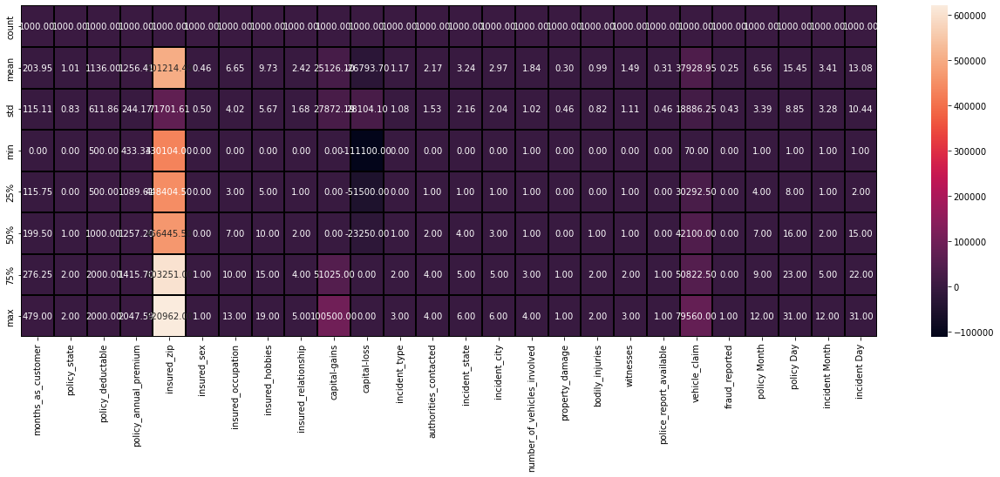

In [856]:
plt.figure(figsize = (22,7))
sns.heatmap(INS.describe(),annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

In [857]:
INS.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   policy_state                 1000 non-null   float64
 2   policy_deductable            1000 non-null   int64  
 3   policy_annual_premium        1000 non-null   float64
 4   insured_zip                  1000 non-null   int64  
 5   insured_sex                  1000 non-null   float64
 6   insured_occupation           1000 non-null   float64
 7   insured_hobbies              1000 non-null   float64
 8   insured_relationship         1000 non-null   float64
 9   capital-gains                1000 non-null   int64  
 10  capital-loss                 1000 non-null   int64  
 11  incident_type                1000 non-null   float64
 12  authorities_contacted        1000 non-null   float64
 13  incident_state     

Now lets Check And Remove Outliers in the dataset 
OUTLIERS CHECKING(Any One outlier method can be used)OUTLIERS CHECKING(Any One outlier method can be  used)

In [858]:
colmlist=INS.columns.values
ncol=30
nrows=14

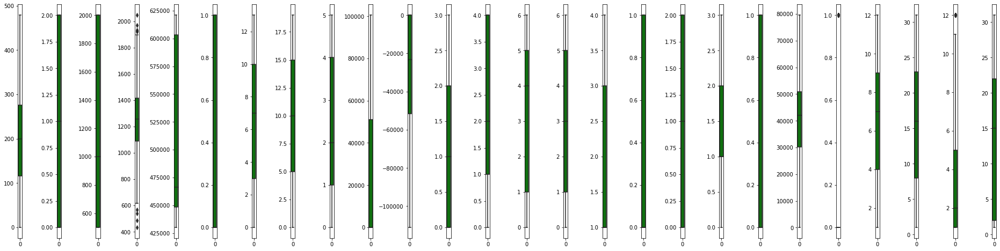

In [859]:
plt.figure(figsize=(ncol,3*ncol))
for i in range (0,len(colmlist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data=INS[colmlist[i]],color='green',orient='v')
    plt.tight_layout()

months_as_customer             AxesSubplot(0.125,0.125;0.025x0.755)
policy_state                   AxesSubplot(0.155,0.125;0.025x0.755)
policy_deductable              AxesSubplot(0.185,0.125;0.025x0.755)
policy_annual_premium          AxesSubplot(0.215,0.125;0.025x0.755)
insured_zip                    AxesSubplot(0.245,0.125;0.025x0.755)
insured_sex                    AxesSubplot(0.275,0.125;0.025x0.755)
insured_occupation             AxesSubplot(0.305,0.125;0.025x0.755)
insured_hobbies                AxesSubplot(0.335,0.125;0.025x0.755)
insured_relationship           AxesSubplot(0.365,0.125;0.025x0.755)
capital-gains                  AxesSubplot(0.395,0.125;0.025x0.755)
capital-loss                   AxesSubplot(0.425,0.125;0.025x0.755)
incident_type                  AxesSubplot(0.455,0.125;0.025x0.755)
authorities_contacted          AxesSubplot(0.485,0.125;0.025x0.755)
incident_state                 AxesSubplot(0.515,0.125;0.025x0.755)
incident_city                  AxesSubplot(0.545

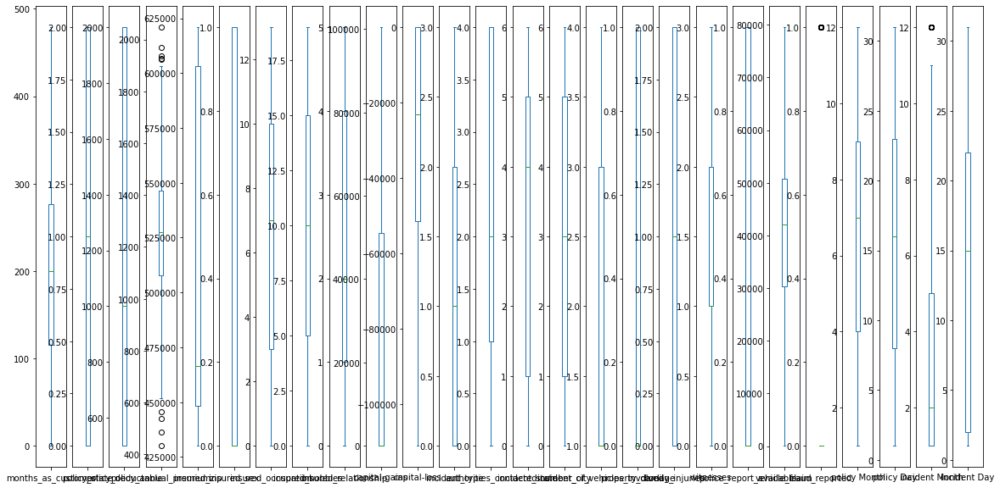

In [860]:
# to find out outliers in the dataset
INS.plot(kind='box',subplots=True,figsize=(20,10))

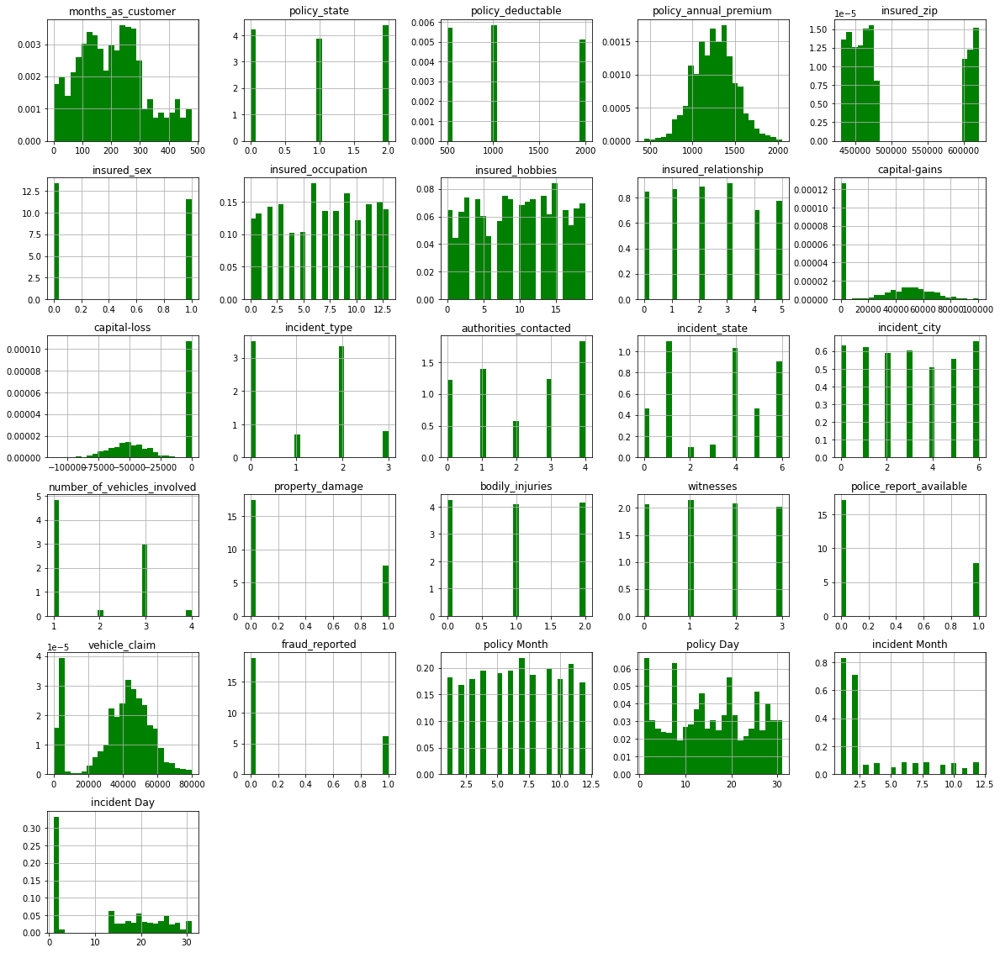

In [940]:
#Lets plot all using Histogram and see the skewness again
 
plt.rcParams['figure.figsize']=(20,20)
INS.hist(bins=25,color='green',density=True,label='Value',histtype='bar')
plt.show()

In [862]:
#to check for outliers through zscore 
from scipy.stats import zscore
(np.abs(zscore( INS)) < 3).all()

months_as_customer              True
policy_state                    True
policy_deductable               True
policy_annual_premium          False
insured_zip                     True
insured_sex                     True
insured_occupation              True
insured_hobbies                 True
insured_relationship            True
capital-gains                   True
capital-loss                   False
incident_type                   True
authorities_contacted           True
incident_state                  True
incident_city                   True
number_of_vehicles_involved     True
property_damage                 True
bodily_injuries                 True
witnesses                       True
police_report_available         True
vehicle_claim                   True
fraud_reported                  True
policy Month                    True
policy Day                      True
incident Month                  True
incident Day                    True
dtype: bool

In [863]:
#to remove outliers in data set through zscore
z = np.abs(zscore( INS))
z.shape

(1000, 26)

In [864]:
threshold = 3
print(np.where(z>3))

(array([229, 248, 763, 807], dtype=int64), array([ 3,  3,  3, 10], dtype=int64))


In [865]:
INS_new=INS[(z<3).all(axis=1)]
print(INS_new.shape)


(996, 26)


In [866]:
INS.shape

(1000, 26)

In [867]:
print ("Old DataFrame =",INS.shape)
print ("New DataFrame =",INS_new.shape)
print ("Total dropped rows = ",INS.shape[0] - INS_new.shape[0])

Old DataFrame = (1000, 26)
New DataFrame = (996, 26)
Total dropped rows =  4


In [868]:
#to find % loss in data
loss = (1000-996)/1000 * 100
print(loss)

0.4


In [869]:
INS_new

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,fraud_reported,policy Month,policy Day,incident Month,incident Day
0,328,2.0,1000,1406.91,466132,1.0,2.0,17.0,0.0,53300,...,1.0,1,2,1.0,52080,1.0,10,17,1,25
1,228,1.0,2000,1197.22,468176,1.0,6.0,15.0,2.0,0,...,0.0,0,0,0.0,3510,1.0,6,27,1,21
2,134,2.0,2000,1413.14,430632,0.0,11.0,2.0,3.0,35100,...,0.0,2,3,0.0,23100,0.0,6,9,2,22
3,256,0.0,2000,1415.74,608117,0.0,1.0,2.0,4.0,48900,...,0.0,1,2,0.0,50720,1.0,5,25,10,1
4,228,0.0,1000,1583.91,610706,1.0,11.0,2.0,4.0,66000,...,0.0,0,1,0.0,4550,0.0,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,2.0,1000,1310.80,431289,0.0,2.0,13.0,4.0,0,...,1.0,0,1,0.0,61040,0.0,7,16,2,22
996,285,0.0,1000,1436.79,608177,0.0,9.0,17.0,5.0,70900,...,1.0,2,3,0.0,72320,0.0,5,1,1,24
997,130,2.0,500,1383.49,442797,0.0,1.0,3.0,2.0,35100,...,0.0,2,3,1.0,52500,0.0,2,17,1,23
998,458,0.0,2000,1356.92,441714,1.0,5.0,0.0,5.0,0,...,0.0,0,1,1.0,36540,0.0,11,18,2,26


Now Lets Split the dataset into dependent and independent variable

In [870]:
#seperate feature variable and target variable
x = INS_new.drop (['fraud_reported'], axis = 1)
y = INS_new['fraud_reported']

In [871]:
x.shape

(996, 25)

# TRANSFORMING DATA TO REMOVE SKEWNESS

In [872]:
INS

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,fraud_reported,policy Month,policy Day,incident Month,incident Day
0,328,2.0,1000,1406.91,466132,1.0,2.0,17.0,0.0,53300,...,1.0,1,2,1.0,52080,1.0,10,17,1,25
1,228,1.0,2000,1197.22,468176,1.0,6.0,15.0,2.0,0,...,0.0,0,0,0.0,3510,1.0,6,27,1,21
2,134,2.0,2000,1413.14,430632,0.0,11.0,2.0,3.0,35100,...,0.0,2,3,0.0,23100,0.0,6,9,2,22
3,256,0.0,2000,1415.74,608117,0.0,1.0,2.0,4.0,48900,...,0.0,1,2,0.0,50720,1.0,5,25,10,1
4,228,0.0,1000,1583.91,610706,1.0,11.0,2.0,4.0,66000,...,0.0,0,1,0.0,4550,0.0,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,2.0,1000,1310.80,431289,0.0,2.0,13.0,4.0,0,...,1.0,0,1,0.0,61040,0.0,7,16,2,22
996,285,0.0,1000,1436.79,608177,0.0,9.0,17.0,5.0,70900,...,1.0,2,3,0.0,72320,0.0,5,1,1,24
997,130,2.0,500,1383.49,442797,0.0,1.0,3.0,2.0,35100,...,0.0,2,3,1.0,52500,0.0,2,17,1,23
998,458,0.0,2000,1356.92,441714,1.0,5.0,0.0,5.0,0,...,0.0,0,1,1.0,36540,0.0,11,18,2,26


In [873]:
INS.skew()

months_as_customer             0.362177
policy_state                  -0.026177
policy_deductable              0.477887
policy_annual_premium          0.004402
insured_zip                    0.816554
insured_sex                    0.148630
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777
witnesses                      0.019636
police_report_available        0.802728
vehicle_claim                 -0.621098
fraud_reported                 1.175051
policy Month                  -0.029321
policy Day                     0.024372
incident Month                 1.375894


In [874]:
from sklearn.preprocessing import power_transform
x_new=power_transform(INS,method='yeo-johnson')

In [875]:
pd.DataFrame(x_new).skew()

0    -0.135661
1    -0.145377
2     0.023988
3     0.004758
4     0.000000
5     0.148630
6    -0.239336
7    -0.247798
8    -0.160421
9     0.038722
10    0.090488
11   -0.088766
12   -0.227269
13   -0.255777
14   -0.181772
15    0.363693
16    0.863806
17   -0.128799
18   -0.153648
19    0.802728
20   -0.522718
21    1.175051
22   -0.171414
23   -0.213211
24    0.306468
25   -0.221642
dtype: float64

In [876]:
# It will be a 2 dimensional data containg rows and columns

from sklearn.preprocessing import StandardScaler
#transforming my dataset into a standard normal distribution
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,policy Month,policy Day,incident Month,incident Day
0,1.074613,1.184086,-0.222363,0.622596,-0.488822,1.075102,-1.159912,1.279174,-1.435517,1.012747,...,-0.823212,1.515920,0.007356,0.466826,1.477196,0.749985,1.014243,0.178038,-0.734862,1.139781
1,0.206140,-0.019332,1.412128,-0.248982,-0.460275,1.075102,-0.164202,0.927079,-0.245525,-0.901322,...,-0.823212,-0.659665,-1.213749,-1.335340,-0.676958,-1.823939,-0.165536,1.310390,-0.734862,0.756390
2,-0.610224,1.184086,1.412128,0.648491,-0.984632,-0.930144,1.080435,-1.361542,0.349470,0.359163,...,1.140667,-0.659665,1.228462,1.367910,-0.676958,-0.785784,-0.165536,-0.727843,-0.429512,0.852238
3,0.449313,-1.222750,1.412128,0.659298,1.494207,-0.930144,-1.408840,-1.361542,0.944466,0.854738,...,-0.823212,-0.659665,0.007356,0.466826,-0.676958,0.677913,-0.460481,1.083920,2.013282,-1.160567
4,0.206140,-1.222750,-0.222363,1.358299,1.530366,1.075102,1.080435,-1.361542,0.944466,1.468820,...,-0.823212,-0.659665,-1.213749,-0.434257,-0.676958,-1.768825,-0.165536,-1.067548,-0.429512,0.372998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,-1.747924,1.184086,-0.222363,0.223114,-0.975456,-0.930144,-1.159912,0.574983,0.944466,-0.901322,...,-0.823212,1.515920,-1.213749,-0.434257,-0.676958,1.224812,0.129409,0.064803,-0.429512,0.852238
992,0.701170,-1.222750,-0.222363,0.746793,1.495045,-0.930144,0.582580,1.279174,1.539462,1.644785,...,-0.823212,1.515920,1.228462,1.367910,-0.676958,1.822585,-0.460481,-1.633724,-0.734862,1.043933
993,-0.644963,1.184086,-1.039608,0.525251,-0.814730,-0.930144,-1.408840,-1.185494,-0.245525,0.359163,...,1.140667,-0.659665,1.228462,1.367910,1.477196,0.772242,-1.345316,0.178038,-0.734862,0.948085
994,2.203629,-1.222750,1.412128,0.414812,-0.829856,1.075102,-0.413130,-1.713637,1.539462,-0.901322,...,-0.823212,-0.659665,-1.213749,-0.434257,1.477196,-0.073544,1.309188,0.291274,-0.429512,1.235629


In [877]:
x.mean()

months_as_customer            -5.261298e-17
policy_state                   1.727757e-16
policy_deductable             -3.991954e-16
policy_annual_premium          3.633863e-16
insured_zip                   -3.736413e-16
insured_sex                    2.697530e-17
insured_occupation             4.102029e-17
insured_hobbies                2.067735e-17
insured_relationship           8.739105e-17
capital-gains                  7.802772e-17
capital-loss                  -1.123599e-16
incident_type                  1.096847e-16
authorities_contacted          2.251657e-17
incident_state                -2.675236e-17
incident_city                 -8.805986e-18
number_of_vehicles_involved    3.366339e-17
property_damage               -3.261559e-16
bodily_injuries                6.732678e-17
witnesses                     -5.038362e-17
police_report_available       -1.672023e-18
vehicle_claim                 -2.207070e-17
policy Month                  -2.617273e-16
policy Day                    -7

In [878]:
x.std()

months_as_customer             1.000502
policy_state                   1.000502
policy_deductable              1.000502
policy_annual_premium          1.000502
insured_zip                    1.000502
insured_sex                    1.000502
insured_occupation             1.000502
insured_hobbies                1.000502
insured_relationship           1.000502
capital-gains                  1.000502
capital-loss                   1.000502
incident_type                  1.000502
authorities_contacted          1.000502
incident_state                 1.000502
incident_city                  1.000502
number_of_vehicles_involved    1.000502
property_damage                1.000502
bodily_injuries                1.000502
witnesses                      1.000502
police_report_available        1.000502
vehicle_claim                  1.000502
policy Month                   1.000502
policy Day                     1.000502
incident Month                 1.000502
incident Day                   1.000502


In [879]:
INS['fraud_reported'].value_counts()

0.0    753
1.0    247
Name: fraud_reported, dtype: int64

Balancing the dataset over here,otherwise it will be a baised dataset

In [880]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)

In [881]:
x.shape

(1500, 25)

In [882]:
y.value_counts()

1.0    750
0.0    750
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

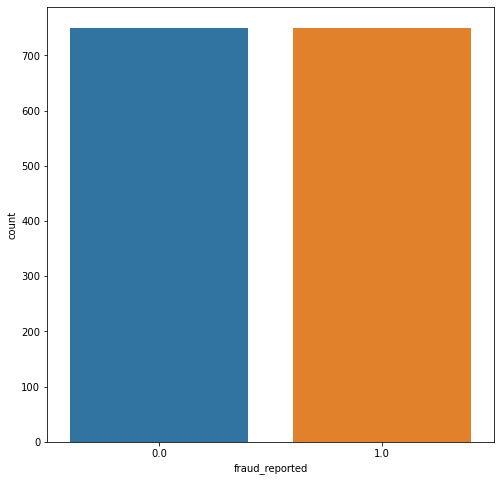

In [883]:
plt.figure(figsize=(8,8))
sns.countplot(y)

WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [884]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [885]:
vif_cal()

    VIF FACTOR                     FEATURES
0     1.050489           months_as_customer
1     1.028228                 policy_state
2     1.041609            policy_deductable
3     1.039569        policy_annual_premium
4     1.041761                  insured_zip
5     1.032753                  insured_sex
6     1.031273           insured_occupation
7     1.076097              insured_hobbies
8     1.056892         insured_relationship
9     1.047187                capital-gains
10    1.034519                 capital-loss
11    6.003765                incident_type
12    1.075843        authorities_contacted
13    1.048060               incident_state
14    1.019357                incident_city
15    5.996806  number_of_vehicles_involved
16    1.032522              property_damage
17    1.039751              bodily_injuries
18    1.030440                    witnesses
19    1.031106      police_report_available
20    1.123428                vehicle_claim
21    1.065835                 p

# No Multicollinearity is present in the dataset...Here we can observe all the columns have VIF less than 10 which means we are free from multicollinearity problem. Let's move to buliding machine learning models...


In [886]:
# to predict best random state value
maxAcc =0
maxRS=0

for i in range(1,996):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=i)
    LR = LogisticRegression()
    LR.fit(x_train,y_train)
    predrf = LR.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print('Best accuracy is',maxAcc,'on Random_State',maxRS)

Best accuracy is 0.6666666666666666 on Random_State 778


In [913]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=778)

In [914]:
print('shape of x_train:',x_train.shape)
print('shape of y_train:',x_train.shape)
print('shape of x_test:',x_test.shape)
print('shape of y_test:',y_test.shape)

shape of x_train: (1200, 25)
shape of y_train: (1200, 25)
shape of x_test: (300, 25)
shape of y_test: (300,)


In [915]:
x_train

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,policy Month,policy Day,incident Month,incident Day
1367,0.144834,-0.207881,-1.039608,2.392360,1.501216,0.760924,0.270569,1.631270,-1.342294,-0.901322,...,-0.823212,1.175054,-0.831109,-0.434257,-0.676958,0.105044,0.129409,-0.978841,-0.734862,0.726355
99,0.301672,-1.222750,-0.222363,-1.195503,-0.506881,1.075102,-0.910985,0.927079,-0.840521,-0.901322,...,-0.823212,-0.659665,-1.213749,-1.335340,-0.676958,-1.787373,0.719298,0.517744,-0.734862,1.235629
262,-1.044461,-1.222750,1.412128,-0.919968,-0.608669,-0.930144,0.831508,0.222888,1.539462,0.693137,...,-0.823212,-0.659665,0.007356,-1.335340,1.477196,0.211565,-0.165536,0.064803,-0.734862,1.619020
409,-1.044461,1.184086,-0.222363,-0.581711,-0.383892,-0.930144,-0.164202,1.455222,-0.840521,-0.901322,...,-0.823212,1.515920,1.228462,-1.335340,1.477196,-1.747097,0.719298,-1.294018,2.623981,-1.064720
9,0.067185,-1.222750,-1.039608,0.243398,1.394570,1.075102,0.333653,-1.009446,1.539462,-0.901322,...,-0.823212,-0.659665,1.228462,-0.434257,-0.676958,-0.266442,0.129409,1.083920,0.486536,-1.160567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,-0.358367,-0.019332,1.412128,0.817994,1.487056,-0.930144,0.084725,1.631270,-0.245525,0.955289,...,-0.823212,1.515920,1.228462,1.367910,-0.676958,0.939173,-1.345316,-0.614608,-0.429512,0.756390
509,0.683801,1.184086,-0.222363,0.904200,-0.759451,-0.930144,1.080435,0.574983,-1.435517,-0.901322,...,-0.823212,-0.659665,1.228462,1.367910,-0.676958,-1.749217,-0.755426,-1.633724,-0.429512,0.372998
796,-1.478698,-0.019332,1.412128,1.219554,-0.914800,-0.930144,-1.408840,-0.481303,0.349470,-0.901322,...,-0.823212,1.515920,-1.213749,-0.434257,-0.676958,-1.870043,-0.165536,0.291274,-0.734862,-1.064720
869,1.022505,-1.222750,1.412128,0.083123,-0.967579,-0.930144,-1.408840,0.222888,0.349470,-0.901322,...,-0.823212,-0.659665,-1.213749,0.466826,1.477196,-0.585467,0.719298,0.970684,-0.734862,0.564694


In [916]:
y_test

1119    1.0
153     0.0
1208    1.0
323     0.0
767     0.0
       ... 
614     1.0
857     0.0
88      0.0
1006    1.0
355     0.0
Name: fraud_reported, Length: 300, dtype: float64

In [917]:
x_test

,months_as_customer,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,policy Month,policy Day,incident Month,incident Day
1119,1.247150,-0.019332,-0.222363,0.967108,-0.681729,-0.930144,1.329363,-0.255164,0.038274,1.216165,...,-0.823212,1.515920,-1.213749,0.723215,0.963455,0.711502,0.662538,0.275632,-0.734862,0.450401
153,1.969141,1.184086,-0.222363,0.478615,-0.902020,-0.930144,-1.159912,0.574983,0.349470,-0.269284,...,1.140667,-0.659665,1.228462,1.367910,-0.676958,0.224283,1.309188,-0.501372,1.402583,-1.160567
1208,1.530599,-0.019332,0.708949,-0.560169,-0.612397,-0.067462,0.828648,0.247459,-0.245525,0.769861,...,1.700163,0.579955,-1.213749,-0.947683,-0.676958,0.021923,0.887354,-0.374935,-0.734862,1.316998
323,1.691229,-1.222750,1.412128,-1.087184,-0.509311,1.075102,1.329363,1.279174,-0.840521,-0.901322,...,1.140667,1.515920,0.007356,-0.434257,1.477196,1.269327,-0.755426,-0.161667,1.097234,-1.064720
767,0.440628,-1.222750,-1.039608,0.187950,-0.972062,-0.930144,0.582580,1.455222,0.349470,-0.901322,...,1.140667,-0.659665,0.007356,-1.335340,-0.676958,0.220044,1.309188,1.083920,2.623981,-1.160567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
614,0.440628,-0.019332,-1.039608,-1.135150,-0.396755,-0.930144,1.578290,-1.361542,0.944466,1.820750,...,0.158727,-0.659665,1.228462,0.466826,-0.676958,0.761113,-0.165536,-1.180783,2.013282,-1.064720
857,0.067185,-1.222750,-0.222363,1.111153,-0.680079,-0.930144,0.084725,-0.129208,-1.435517,1.727381,...,1.140667,1.515920,-1.213749,0.466826,1.477196,1.483423,-1.640261,0.857449,2.318631,-1.064720
88,-1.504752,-1.222750,1.412128,0.254039,1.405255,-0.930144,0.582580,0.222888,-0.840521,-0.901322,...,-0.823212,-0.659665,-1.213749,-0.434257,1.477196,-1.835597,0.424353,-0.048432,-0.734862,1.619020
1006,-0.501940,-0.403427,0.629608,0.593591,-0.735878,-0.290130,-0.434284,-0.825918,1.349557,-0.901322,...,-0.823212,1.515920,0.007356,1.367910,0.010583,1.110427,-1.251178,0.286462,-0.734862,0.511656


In [918]:
y_train

1367    1.0
99      0.0
262     0.0
409     0.0
9       0.0
       ... 
457     0.0
509     0.0
796     0.0
869     0.0
463     0.0
Name: fraud_reported, Length: 1200, dtype: float64

CROSS VALIDATION FOR LOGISTICS REGRESSION,ENSEMBLE TECHNIQUE(GradientBoostingClassifier,RandomForestClassifier)

In [919]:
lg=LogisticRegression()
gnb=GaussianNB()
svc=SVC()
dtc=DecisionTreeClassifier()
knn=KNeighborsClassifier()
gb = GradientBoostingClassifier()
RF = RandomForestClassifier()
ada = AdaBoostClassifier()
etc=ExtraTreesClassifier()

model=[lg,gnb,svc,dtc,knn,RF,gb,ada,etc]
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy_score:",m,'is')
    print(confusion_matrix(y_test, predm))
    print(accuracy_score(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')

Accuracy_score: LogisticRegression() is
[[ 95  68]
 [ 32 105]]
0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.75      0.58      0.66       163
         1.0       0.61      0.77      0.68       137

    accuracy                           0.67       300
   macro avg       0.68      0.67      0.67       300
weighted avg       0.68      0.67      0.67       300



Accuracy_score: GaussianNB() is
[[ 83  80]
 [ 24 113]]
0.6533333333333333
              precision    recall  f1-score   support

         0.0       0.78      0.51      0.61       163
         1.0       0.59      0.82      0.68       137

    accuracy                           0.65       300
   macro avg       0.68      0.67      0.65       300
weighted avg       0.69      0.65      0.65       300



Accuracy_score: SVC() is
[[129  34]
 [ 19 118]]
0.8233333333333334
              precision    recall  f1-score   support

         0.0       0.87      0.79      0.83       163
         1

In [920]:
#cross validation to check the accuracy score
print('cross validation score of random forest model = ', cross_val_score(RF,x,y,cv=None).mean())
print('cross validation score of logistic regression model = ', cross_val_score(lg,x,y,cv=None).mean())
print('cross validation score of decison tree model = ', cross_val_score(dtc,x,y,cv=None).mean())
print('cross validation score of  KNeighborsClassifier model = ', cross_val_score(knn,x,y,cv=None).mean())
print('cross validation score of standard vector machine model = ', cross_val_score(svc,x,y,cv=None).mean())
print('cross validation score of GaussianNB model = ', cross_val_score(gnb,x,y,cv=None).mean())
print('cross validation score of GradientBoostingClassifier model = ',cross_val_score(gb,x,y,cv=None).mean())
print('cross validation score of AdaBoostingClassifier model = ',cross_val_score(ada,x,y,cv=None).mean())
print('cross validation score of ExtraTreesClassifier model = ',cross_val_score(ada,x,y,cv=None).mean())


cross validation score of random forest model =  0.8513333333333334
cross validation score of logistic regression model =  0.5833333333333333
cross validation score of decison tree model =  0.7060000000000001
cross validation score of  KNeighborsClassifier model =  0.6753333333333333
cross validation score of standard vector machine model =  0.8099999999999999
cross validation score of GaussianNB model =  0.6266666666666667
cross validation score of GradientBoostingClassifier model =  0.8213333333333332
cross validation score of AdaBoostingClassifier model =  0.7826666666666666
cross validation score of ExtraTreesClassifier model =  0.7826666666666666


Hyper parameter tuning

Plotting ROC and compare AUC for all the models used

In [921]:
# hyperparameter tuning with RandomForestClassifier, parameters of RandomForestClassifier
parameters ={'n_estimators':[200], 'criterion':['gini'], 
             'min_samples_split':[5], 'min_samples_leaf':[2], 
              'bootstrap':[True],'n_jobs':[-1], 'random_state':[34]}

In [922]:
# hyperparameter tuning with gridsearchCV
gcv = GridSearchCV(RandomForestClassifier(random_state=35), parameters, verbose=1, cv=10, n_jobs=-1)

In [923]:
#training the model
gcv.fit(x_train,y_train)

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=35),
             n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['gini'],
                         'min_samples_leaf': [2], 'min_samples_split': [5],
                         'n_estimators': [200], 'n_jobs': [-1],
                         'random_state': [34]},
             verbose=1)

In [924]:
#finding out which parameter is giving best accuracy
gcv.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 200,
 'n_jobs': -1,
 'random_state': 34}

In [925]:
type(gcv)

sklearn.model_selection._search.GridSearchCV

In [926]:
# finding best estimator
gcv.best_estimator_

RandomForestClassifier(min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, n_jobs=-1, random_state=34)

In [927]:
# Applying the parameters to the final model
pred = gcv.best_estimator_.predict(x_test)
acc =accuracy_score(y_test,pred)
print(acc*100)

87.0


Using AUC - ROC Curve

Text(0.5, 1.0, 'AUC ROC plot')

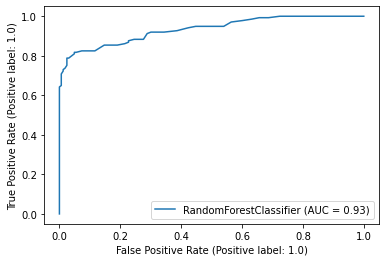

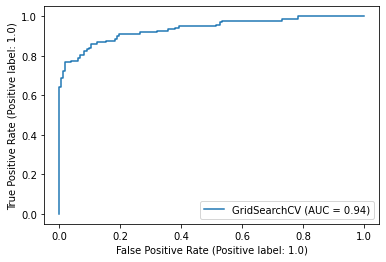

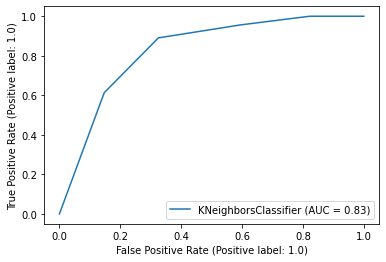

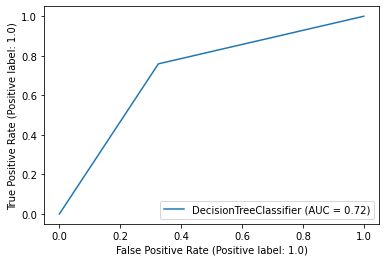

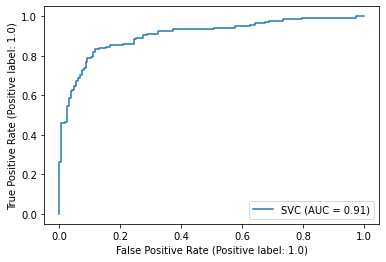

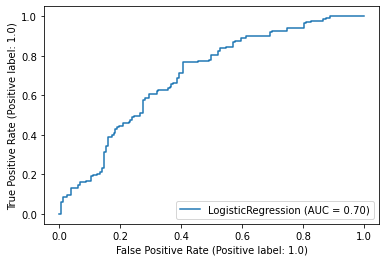

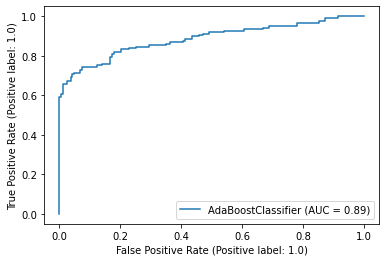

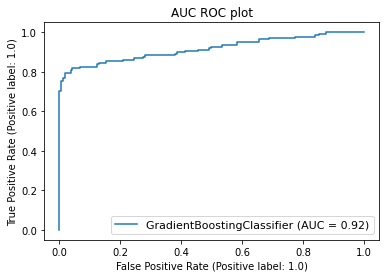

In [928]:
from sklearn.metrics import RocCurveDisplay
disp=RocCurveDisplay.from_estimator(RF, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(gcv, x_test,y_test)
svc_disp = RocCurveDisplay.from_estimator(knn, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(dtc, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(svc, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(lg, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(ada, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(gb, x_test, y_test)
#svc_disp = RocCurveDisplay.from_estimator(RF, x_test, y_test)
#rfc_disp = RocCurveDisplay.from_estimator(rfc, x_test, y_test, ax=svc_disp.ax_)
plt.legend(prop={'size':11}, loc='lower right')
plt.title("AUC ROC plot")


In [929]:
 #Using ROC curve to check best fittted model

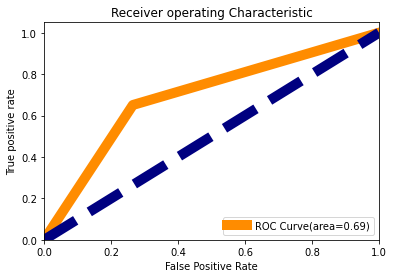

In [930]:
gsv=GridSearchCV
dtc.fit(x_train,y_train)
y_pred=dtc.predict(x_test)
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(y_pred,y_test)
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC Curve(area=%0.2f)' % roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True positive rate')
plt.title('Receiver operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [931]:
#saving the model
import joblib
joblib.dump(gcv,'Insurance Claim.pkl')

['Insurance Claim.pkl']

In [932]:
#Loading the saved model
IC=joblib.load('Insurance Claim.pkl')

In [933]:
prediction = IC.predict(x_test)
prediction

array([1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 1., 1., 0., 0., 0., 1.,
       1., 1., 1., 1., 1., 0., 0., 1., 0., 1., 0., 1., 0., 1., 0., 0., 1.,
       0., 1., 0., 0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0.,
       1., 0., 0., 0., 1., 0., 0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0.,
       1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 1., 0., 0., 0., 1., 1., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 1., 1., 0.,
       0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1.,
       0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0.,
       1., 1., 0., 0., 0., 0., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 1., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1.,
       1., 1., 1., 1., 1.

In [934]:
pd.DataFrame([IC.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
Predicted,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
Original,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0


<AxesSubplot:xlabel='fraud_reported', ylabel='Density'>

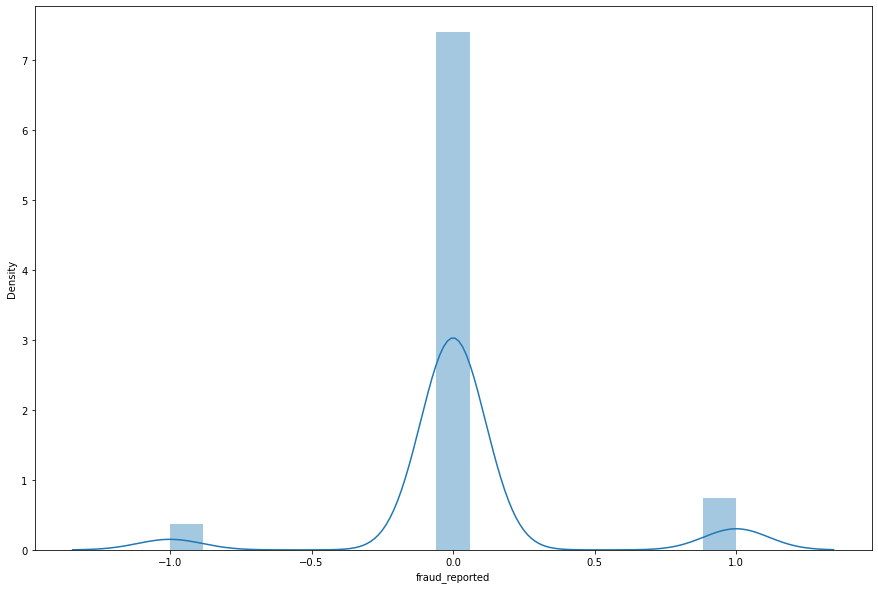

In [935]:
plt.figure(figsize=(15,10))
sns.distplot(y_test-prediction)

In [936]:
import pickle
filename = 'Insurance Claim.pkl'
pickle.dump(gcv,open(filename, 'wb'))

In [937]:
loaded_model = pickle.load(open(filename, 'rb'))
predicted = loaded_model.score(x_test,y_test)*100
print(predicted)

87.0
